In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import scv
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


In [3]:
# set output directory
fig_dir = "/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/figures/"
data_dir = "/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/"

sc.settings.figdir = fig_dir

In [6]:
# load samples from cocaine mouse data:
cellranger_dir = '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/data/April_2023/cellranger/'

samples = os.listdir(cellranger_dir)

['4', '6', '5', '3', '8', '1', '7', '2']

In [25]:
adata_list = []
for sample in samples:
    print(sample)
    adata = sc.read_h5ad('{}{}/outs/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(cellranger_dir, sample))
    adata.obs['Sample_num'] = int(sample)
    adata.obs['orig_barcode'] = adata.obs.index
    adata_list.append(adata)

4
6
5
3
8
1
7
2


In [26]:
# combine all adata objects
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index
print(adata.shape)

# preserve counts
adata.layers["counts"] = adata.X.copy()

/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/torch/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


(107588, 32285)


In [29]:
# load sample metadata:
sample_meta = pd.read_csv('/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/data/April_2023/habenula_april2023_meta.txt', sep='\t')

# merge with anndata obs
temp = adata.obs.merge(sample_meta, how='left', on='Sample_num')
temp.index = temp.barcode
adata.obs = temp


## Quality control

In [30]:
# compute QC metrics
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

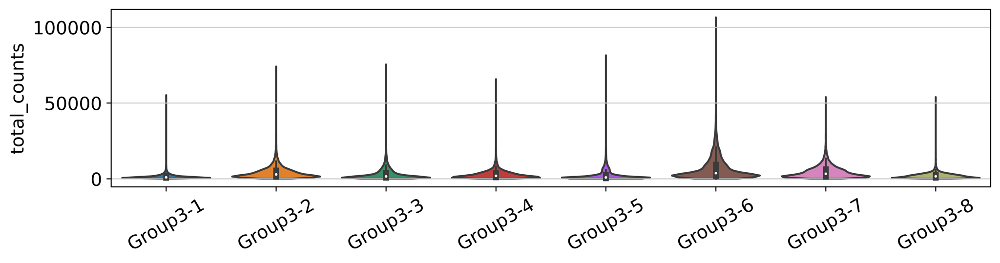

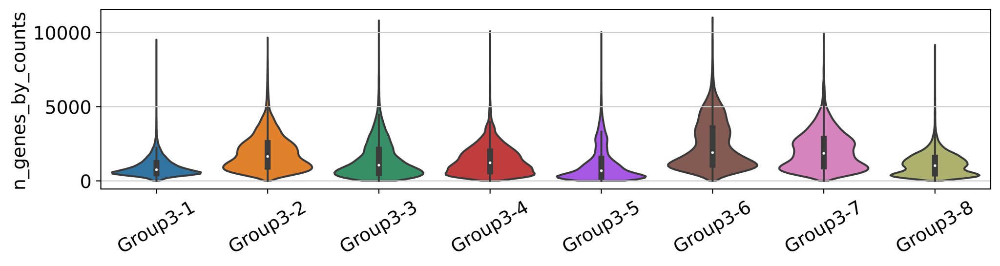

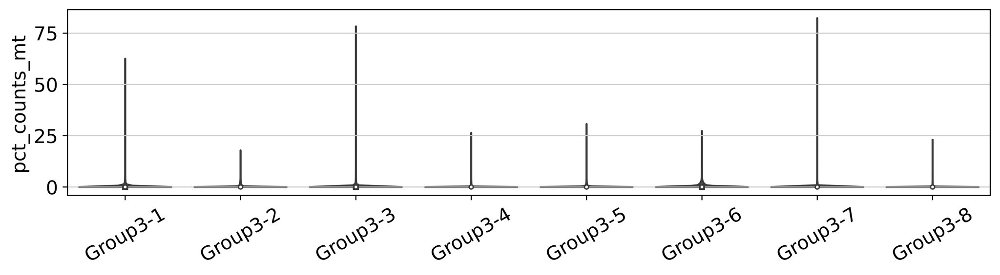

In [31]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [32]:

mt_quantile = 0.975 
umi_quantile = 0.975
doublet_quantile = 0.975

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

Group3-1 removed  1948 , kept  23042
Group3-3 removed  1249 , kept  14121
Group3-5 removed  1230 , kept  13699
Group3-8 removed  1091 , kept  13611
Group3-4 removed  1007 , kept  12657
Group3-7 removed  771 , kept  9638
Group3-2 removed  545 , kept  6772
Group3-6 removed  474 , kept  5733


In [33]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata.shape

(99273, 32285)

In [34]:
# get rid of more outliers:
adata = adata[adata.obs.n_genes_by_counts >= 250]
adata = adata[adata.obs.pct_counts_mt <= 5]
adata = adata[adata.obs.total_counts <= 25000]
adata.shape


(92469, 32285)

In [35]:
# remove predicted doublets
adata = adata[adata.obs.doublets == 'Singlet']
adata.shape


(90495, 32285)

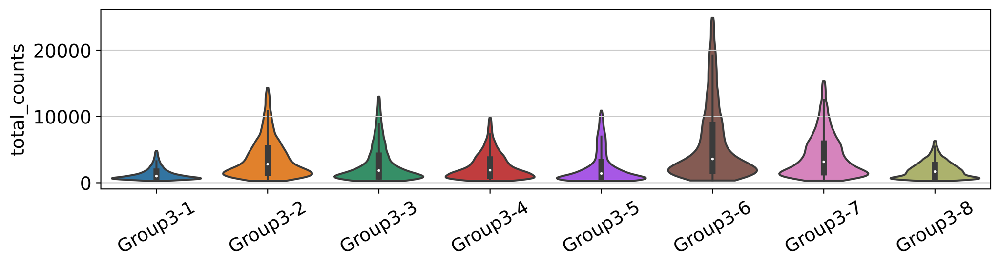

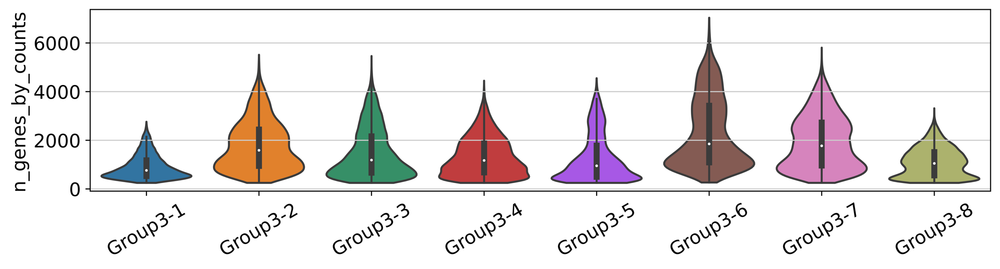

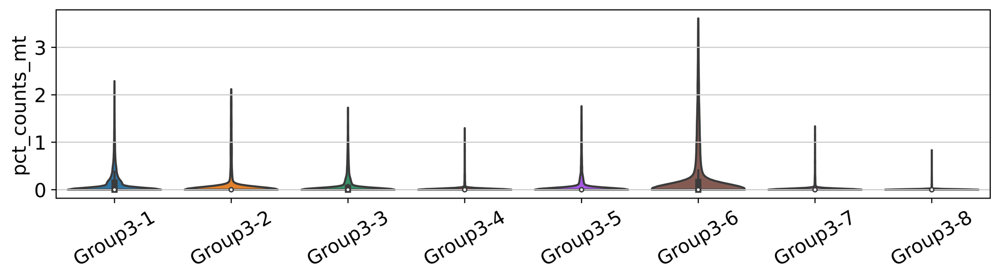

In [36]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [37]:
# save unprocessed data:

adata.obs.index.name = None
adata.write('{}initial_unprocessed_april2023.h5ad'.format(data_dir))

In [38]:
# remove most of the obs columns because it really doesn't like NaNs
adata.obs = adata.obs[['Sample', 'barcode', 'Assignment', 'Group']]

adata.write('{}initial_unprocessed_for_seurat_april2023.h5ad'.format(data_dir))

## Data normalization, clustering, dimensionality reduction

In [39]:
adata = sc.read_h5ad('{}initial_unprocessed_april2023.h5ad'.format(data_dir))

In [40]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [41]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)

/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/torch/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


In [42]:
sc.tl.pca(adata, svd_solver='arpack')

In [43]:
#sc.external.pp.harmony_integrate(adata, key = 'Assignment')

In [44]:
# sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')
sc.pp.neighbors(adata, use_rep = 'X_pca', n_neighbors=15, n_pcs=30, metric='cosine')

In [45]:
sc.tl.umap(adata, min_dist=0.2, method='umap')

In [46]:
sc.tl.leiden(adata, resolution=1.5)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

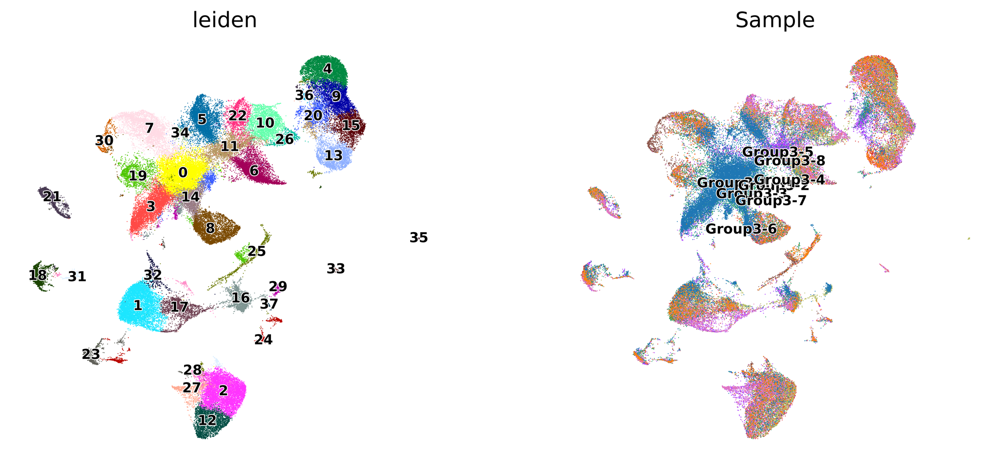

In [50]:
sc.settings.set_figure_params(dpi=500, dpi_save=200, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden', 'Sample'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    save='_leiden_april2023.pdf'
)


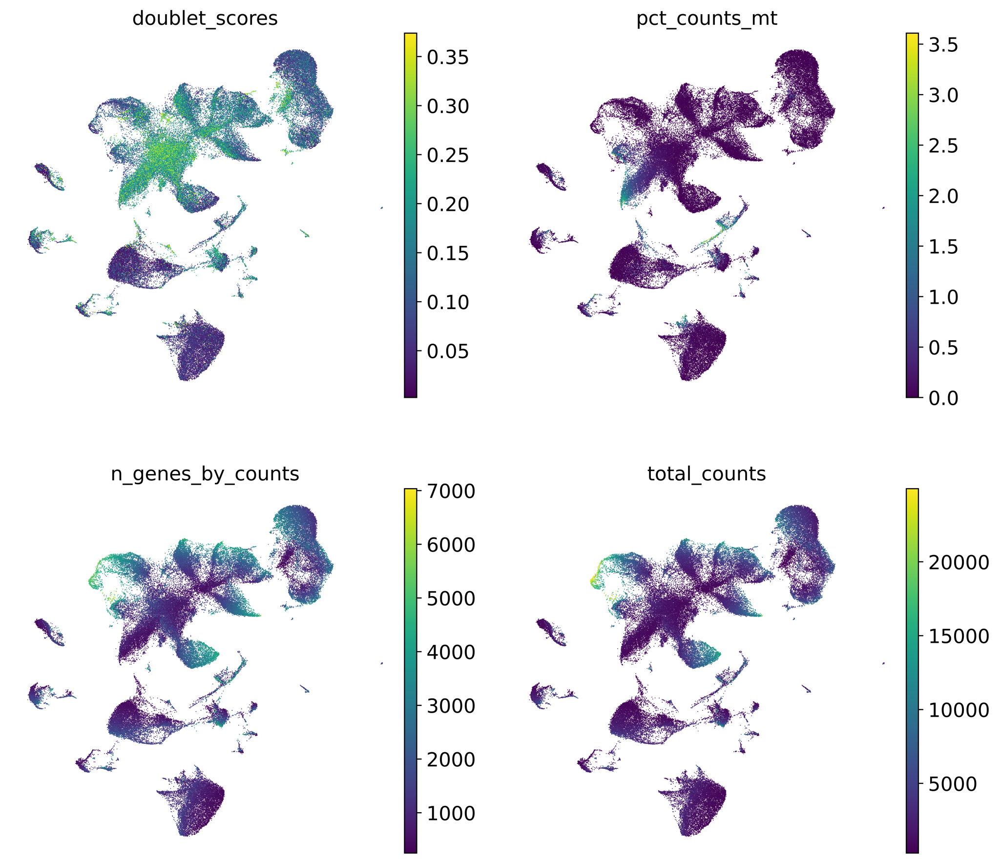

In [51]:
sc.pl.umap(
    adata,
    color=['doublet_scores', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts'],
    frameon=False, 
    ncols=2, 
    save='_qc_april2023.pdf'
)

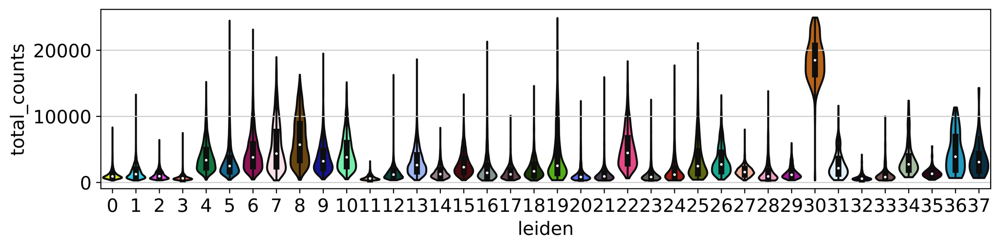

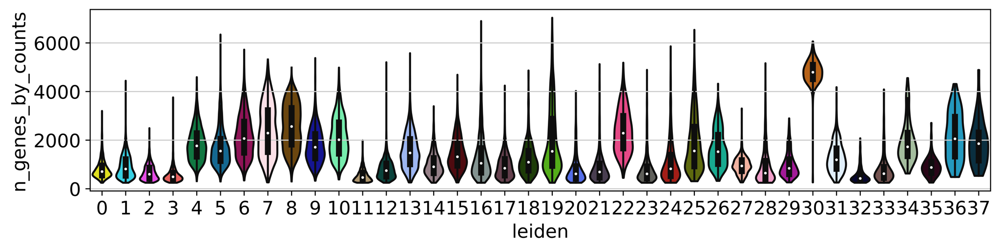

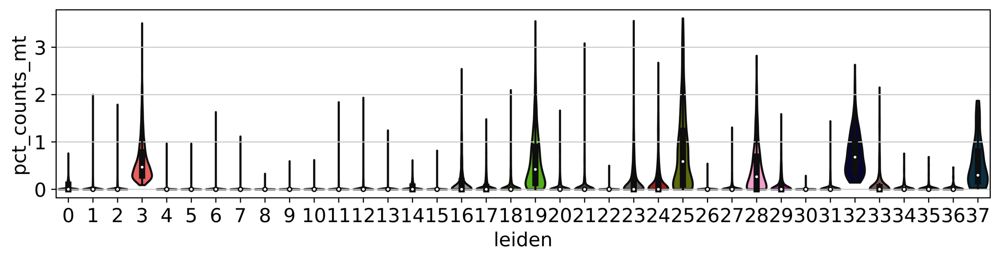

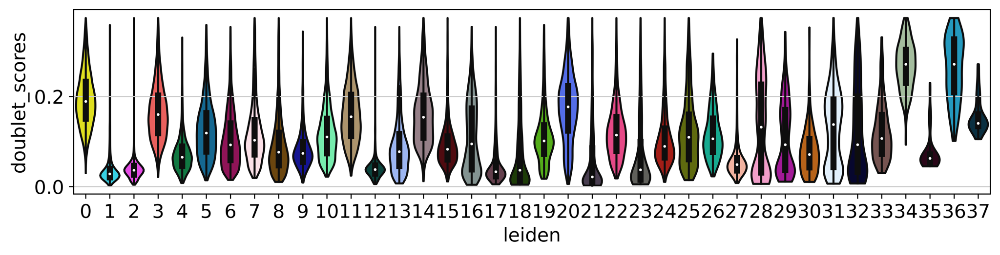

In [52]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False)

categories: 0, 1, 2, etc.
var_group_labels: MF-ODC, Mature ODC, Neuron, etc.


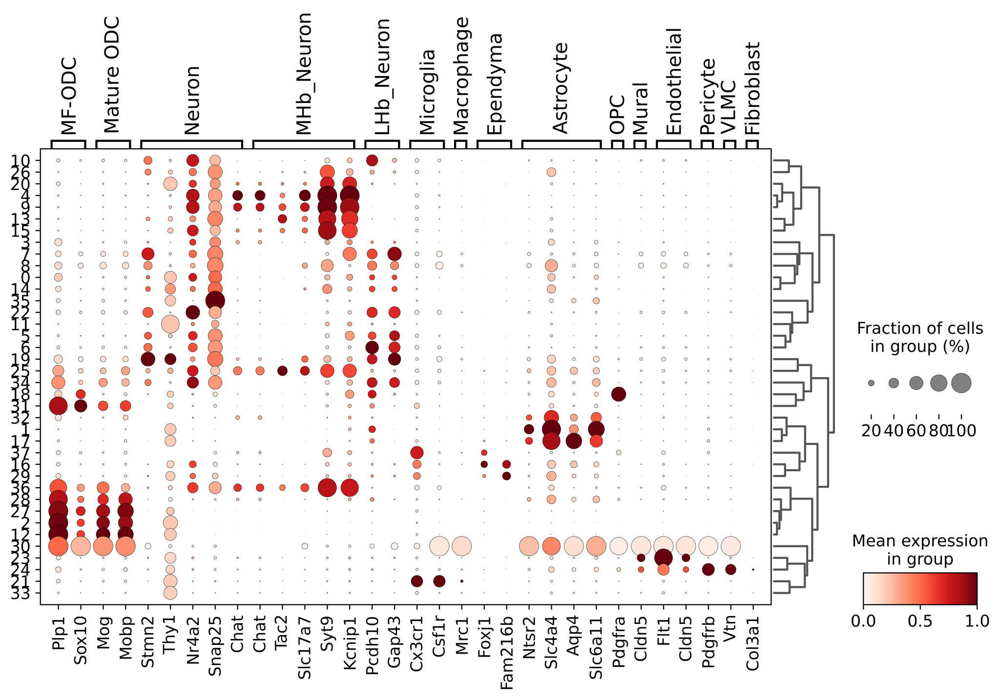

In [54]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(15,5), facecolor='white')

# marker genes from dotplot:
marker_dict = {
    'MF-ODC' : ['Plp1', 'Sox10'],
    'Mature ODC' : ['Mog', 'Mobp'],
    'Neuron' : ['Stmn2', 'Thy1', 'Nr4a2', 'Snap25', 'Chat'],
    'MHb_Neuron': ['Chat', 'Tac2', 'Slc17a7', 'Syt9', 'Kcnip1'],
    'LHb_Neuron': ['Pcdh10', 'Gap43'],
    'Microglia': ['Cx3cr1', 'Csf1r'],
    'Macrophage': ['Mrc1'],
    'Ependyma':['Foxj1', 'Fam216b'],
    'Astrocyte' : ['Ntsr2', 'Slc4a4', 'Aqp4', 'Slc6a11'],
    'OPC' : ['Pdgfra'],
    'Mural' : ['Cldn5'],
    'Endothelial': ['Flt1', 'Cldn5'],
    'Pericyte': ['Pdgfrb'],
    'VLMC': ['Vtn'],
    'Fibroblast': ['Col3a1']
}

sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

In [111]:
clusters_to_remove = [
    '9', 
    '11',
    '12', 
    '18', # highest MT
    '6', # doublet
    '24', # doublet
    '29', # doublet
    '34',
    '48',
    '49',
    '51',
    '52',
    '53',
    '55',
    '56',
    '57'
]

In [59]:
clusters_to_remove = [
    '0', # very high doublet scores 
    '3',
    '11',
    '14',
    '20',
    '34',
    '36',
    '30', # conflicting markers and outlier in the nGenes / nUMI
]

/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/torch/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


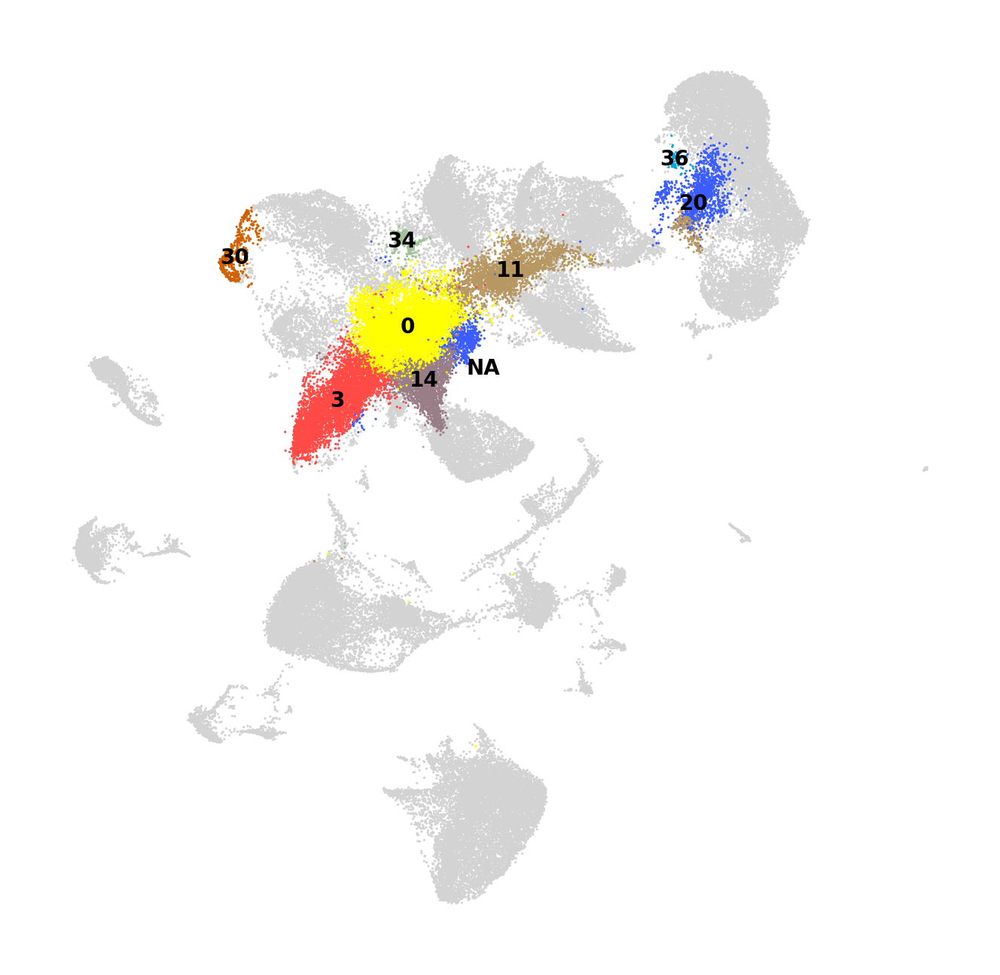

In [61]:
# clusters to remove based on low qc / conflicting markers
sc.settings.set_figure_params(dpi=200, figsize=(4,4), facecolor='white')
sc.pl.umap( 
    adata,
    color=["leiden"], 
    groups=clusters_to_remove,
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title=''
)


In [62]:
# save data
adata.obs.index.name = None
adata.write('{}initial_harmony_april2023.h5ad'.format(data_dir))

## Analyze with more filtering

In [65]:
# re-load first round harmony data and unprocessed data:
adata_unprocessed = sc.read_h5ad('{}initial_unprocessed_april2023.h5ad'.format(data_dir))
adata = sc.read_h5ad('{}initial_harmony_april2023.h5ad'.format(data_dir))


In [66]:
adata.obs.leiden.isin(clusters_to_remove).value_counts()

False    69902
True     20593
Name: leiden, dtype: int64

In [67]:
adata = adata[~adata.obs.leiden.isin(clusters_to_remove)]
adata_unprocessed = adata_unprocessed[adata_unprocessed.obs.barcode.isin(adata.obs.barcode)]
adata_unprocessed.obs = adata.obs

In [68]:
adata = adata_unprocessed

In [69]:
adata.shape

(69902, 32285)

In [70]:
### Run processing again
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [71]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)

/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/torch/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


In [72]:
sc.tl.pca(adata, svd_solver='arpack')

In [73]:
#sc.external.pp.harmony_integrate(adata, key = 'Assignment')

In [74]:
#sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')
sc.pp.neighbors(adata, use_rep = 'X_pca', n_neighbors=15, n_pcs=30, metric='cosine')

In [75]:
sc.tl.umap(adata, min_dist=0.25, method='umap')

In [76]:
adata.obs = adata.obs.drop('leiden', axis=1)

In [77]:
sc.tl.leiden(adata, resolution=0.7)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

In [84]:
adata.obs.Sample.value_counts()

Group3-8    11669
Group3-4    10775
Group3-1     9920
Group3-3     9297
Group3-7     9248
Group3-5     7265
Group3-2     6547
Group3-6     5181
Name: Sample, dtype: int64

In [85]:
adata.obs.Group.value_counts()

NN      36539
NGFP    33363
Name: Group, dtype: int64

In [78]:
adata.obs.leiden.value_counts()

0     9384
1     7486
2     6628
3     5094
4     4397
5     4138
6     4030
7     3895
8     3105
9     2832
10    2791
11    2528
12    2114
13    1962
14    1917
15    1615
16    1304
17    1158
18     831
19     795
20     568
21     469
22     399
23     315
24     119
25      28
Name: leiden, dtype: int64

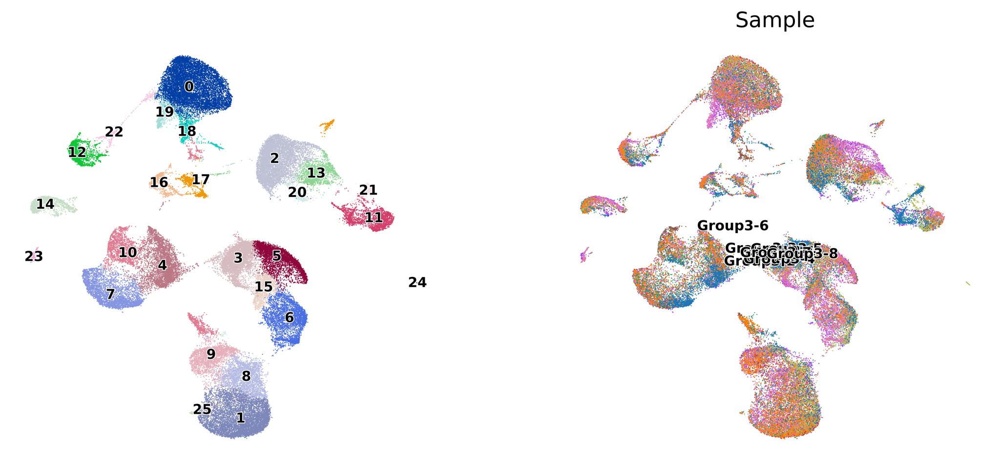

In [80]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden', 'Sample'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden_filtered_april2023.pdf'
)


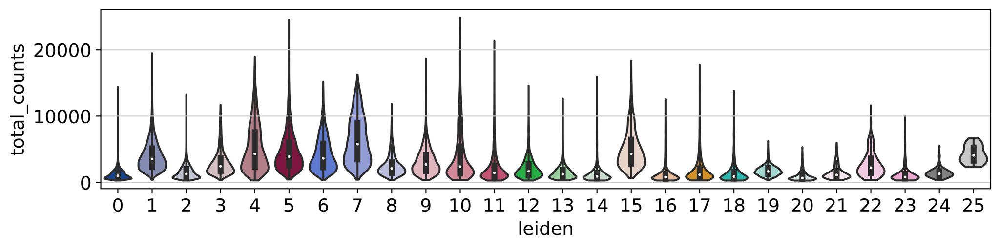

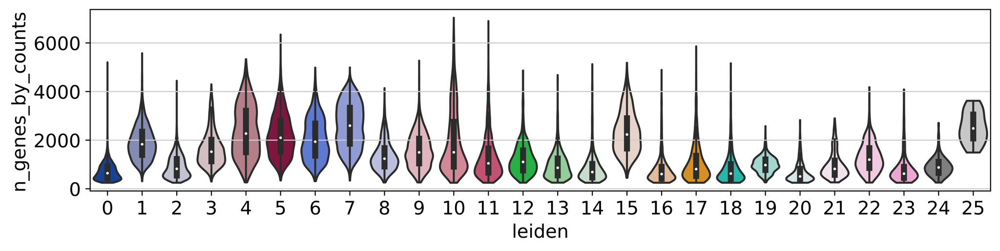

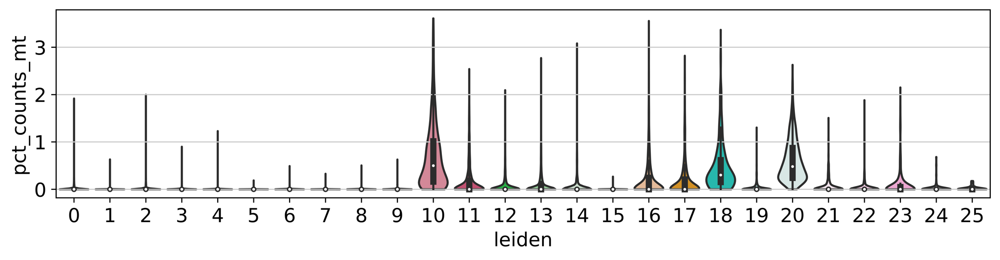

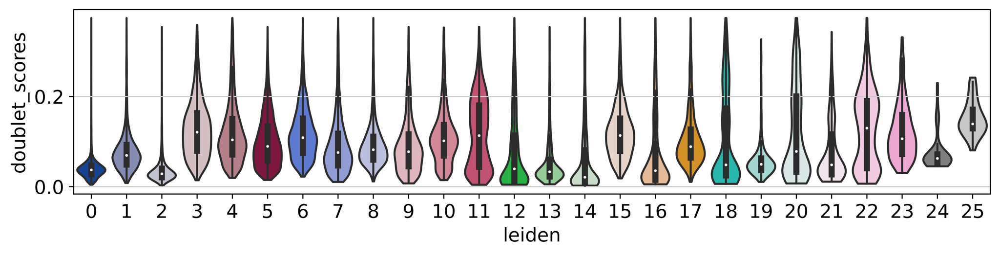

In [83]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False)

categories: 0, 1, 2, etc.
var_group_labels: MF-ODC, Mature ODC, Neuron, etc.


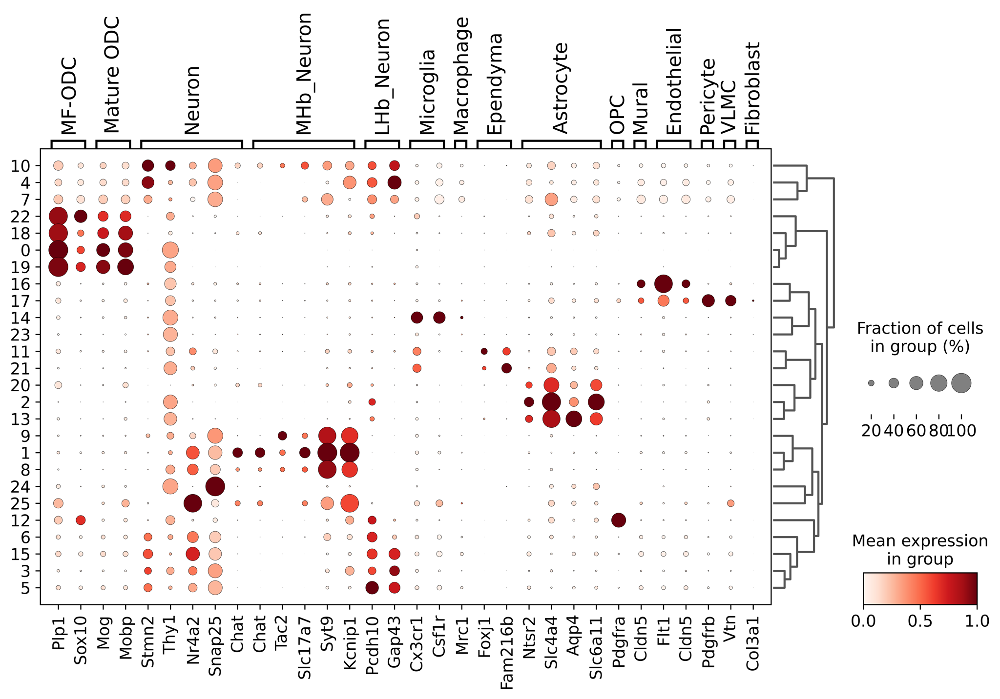

In [82]:
sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers_filtered.pdf')

In [94]:
# remove bad clusters
clusters_to_remove = [
    '10', '7'
]
adata = adata[~adata.obs.leiden.isin(clusters_to_remove)]

/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/torch/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


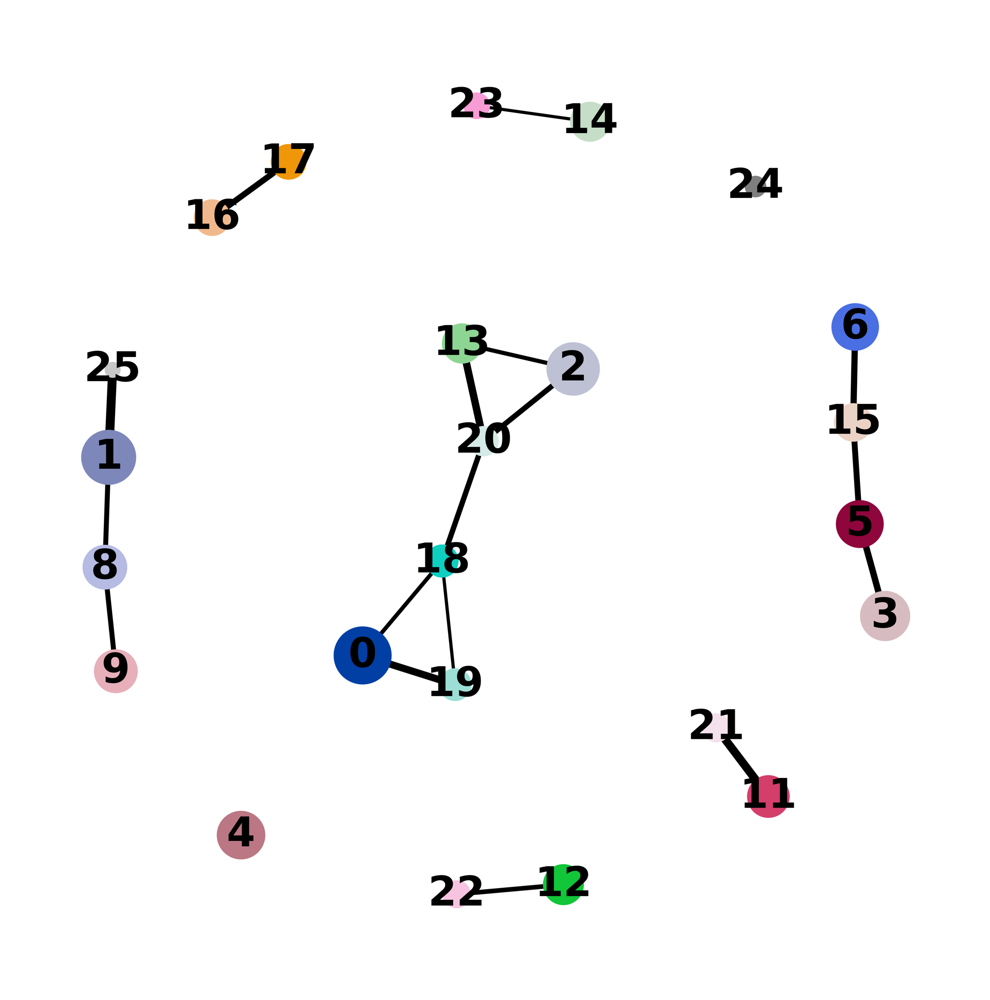

In [95]:
sc.settings.set_figure_params(dpi=500, dpi_save=200, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.25, title='', edge_width_scale=0.5,
    frameon=False, save=True
)

In [96]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.25, init_pos='paga')

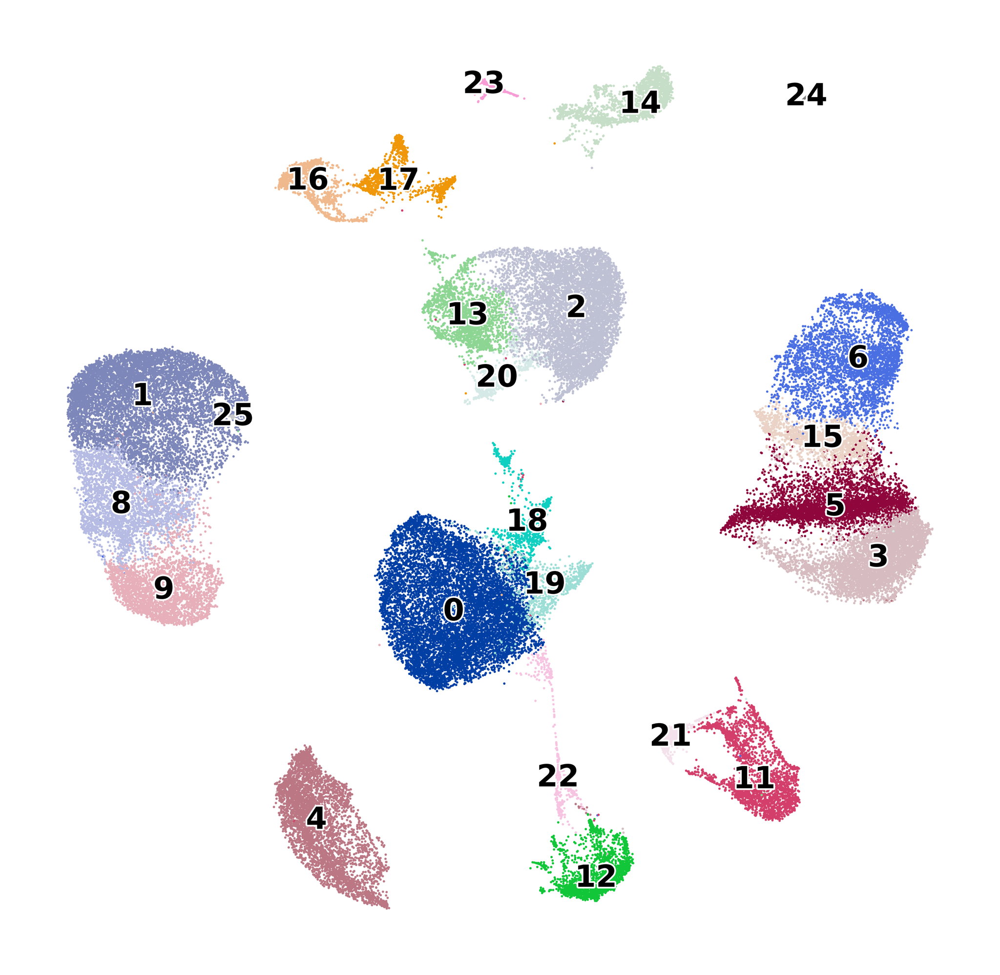

In [97]:
sc.settings.set_figure_params(dpi=500, dpi_save=200, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title='', 
    save='_leiden_filtered_paga_april2023.pdf'
)


In [98]:
# add the UMAP to the obs table:
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]



In [99]:
adata.write('{}harmony_processed_april2023.h5ad'.format(data_dir))

## Broad cell-type annotations

In [103]:
adata = sc.read_h5ad('{}harmony_processed_april2023.h5ad'.format(data_dir))

In [104]:
# load cluster anno df 
anno_df = pd.read_csv(
    '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/data/April_2023/leiden_april2023.csv'
)

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')
adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()


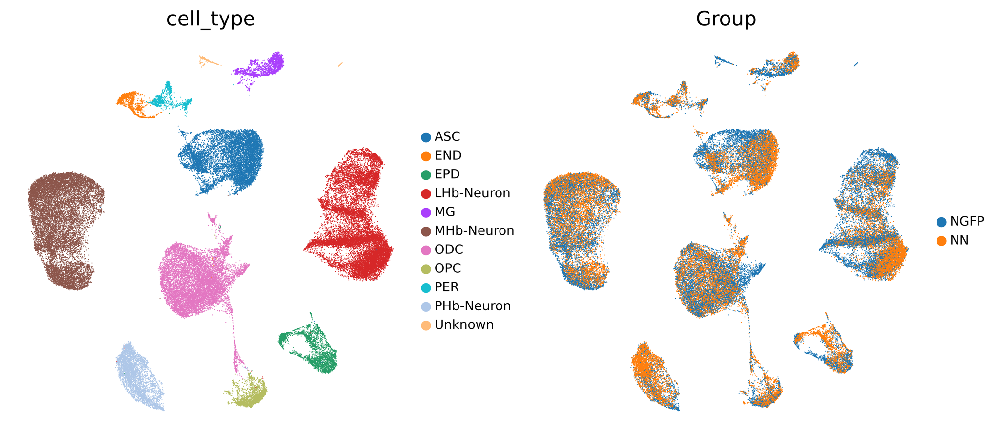

In [109]:
sc.settings.set_figure_params(dpi=500, dpi_save=200, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type', 'Group'],
    frameon=False, 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
)


In [110]:
adata

AnnData object with n_obs × n_vars = 63216 × 32285
    obs: 'doublet_scores', 'doublets', 'Sample_num', 'orig_barcode', 'batch', 'barcode', 'Group', 'Sample', 'Assignment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'UMAP_1', 'UMAP_2', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap', 'cell_type_colors', 'Group_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [106]:
adata.write('{}harmony_processed_april2023.h5ad'.format(data_dir))


# Below: Not run yet on the april 2023 dataset


## Subcluster Neurons

In [ ]:
# re-load dataset
adata = sc.read_h5ad('{}harmony_processed.h5ad'.format(data_dir))

In [207]:
# subset neuronal cells:
adata_neuron = adata[adata.obs.cell_type.isin(['PHb-Neuron', 'LHb-Neuron', 'MHb-Neuron'])]

In [208]:
sc.pp.neighbors(adata_neuron, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')
sc.tl.umap(adata_neuron, min_dist=0.25, method='umap')

In [212]:
sc.tl.leiden(adata_neuron, resolution=0.75)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata_neuron, 'leiden')

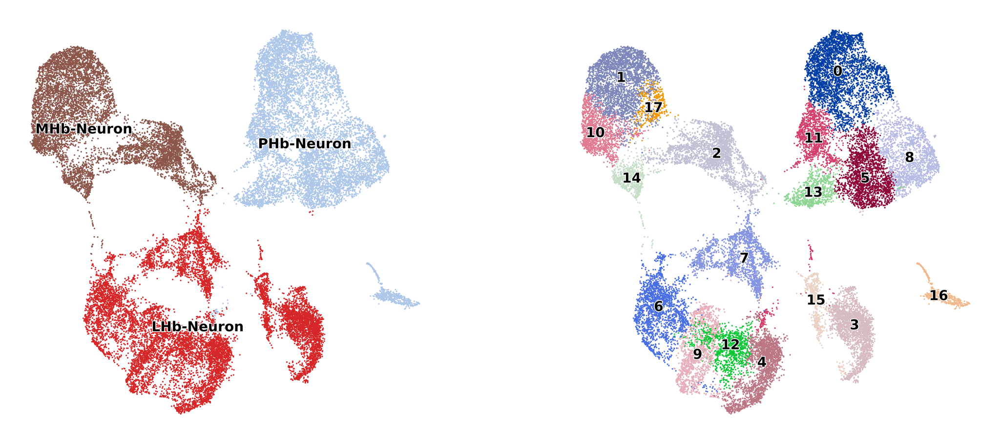

In [213]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden.pdf'
)


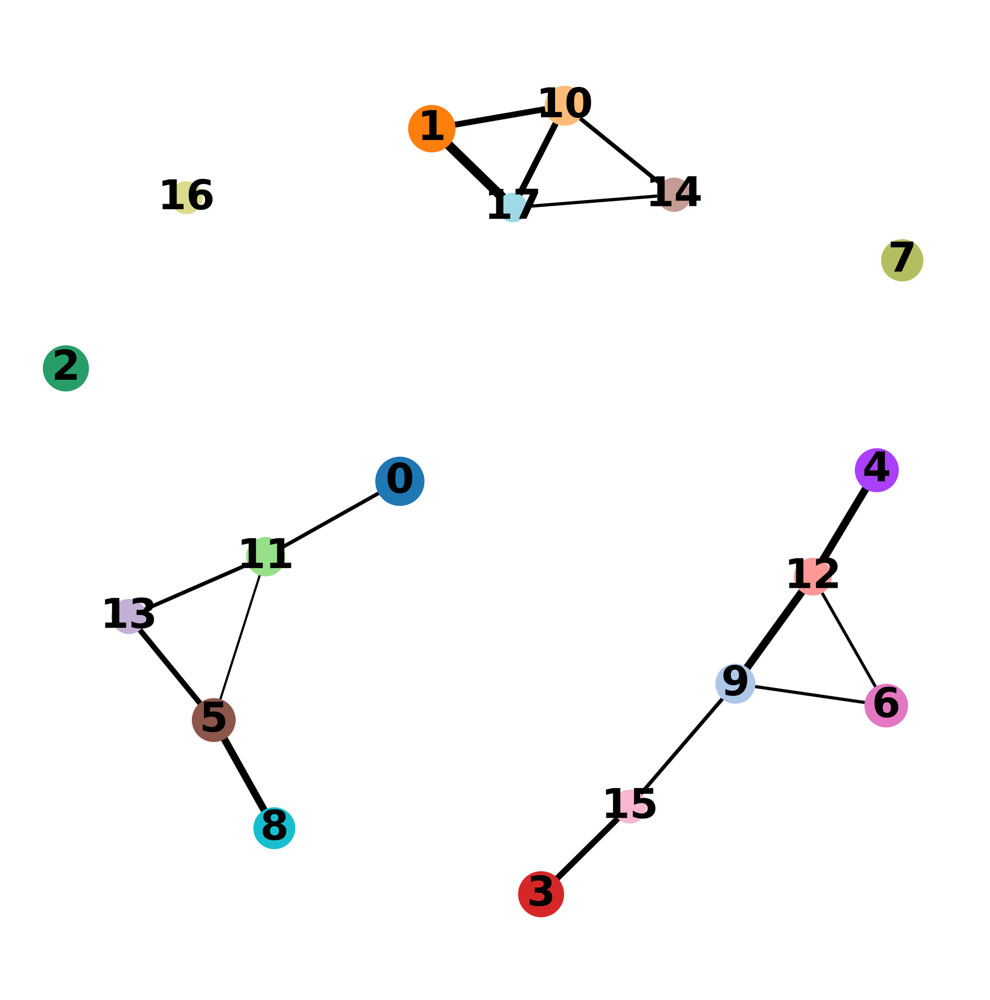

In [218]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata_neuron)
sc.pl.paga(
    adata_neuron, threshold=0.15, title='', edge_width_scale=0.5,
    frameon=False, save='_neuronal_paga.pdf'
)


In [219]:
sc.tl.umap(adata_neuron, min_dist=0.25, init_pos='paga')

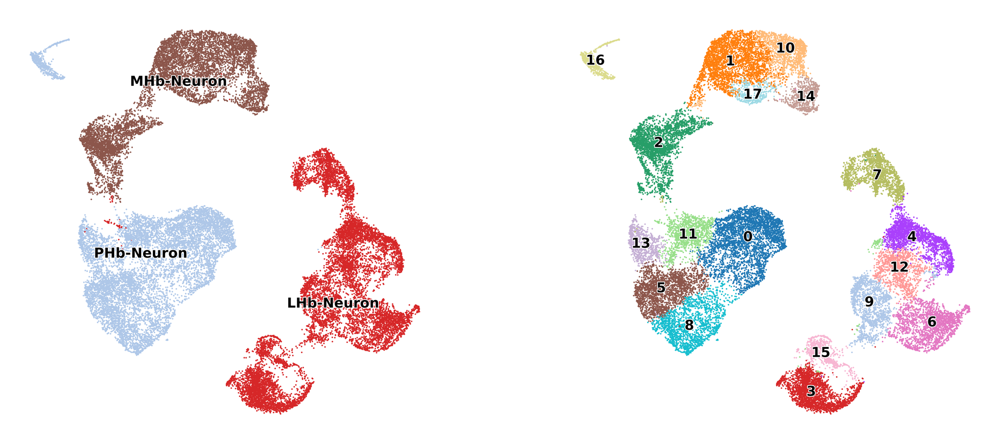

In [220]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden_paga.pdf'
)


In [223]:
# load cluster anno df 
anno_df = pd.read_csv(
    '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/habenula_neuronal_leiden_annotations.csv'
)

anno_df.leiden = anno_df.leiden.astype(str)
anno_df.head()

,leiden,cell_type,annotation
0,0,PHb-Neuron,PHb-1
1,1,MHb-Neuron,MHb-1
2,2,MHb-Neuron,MHb-2
3,3,LHb-Neuron,LHb-1
4,4,LHb-Neuron,LHb-2


In [224]:
adata_neuron.obs = adata_neuron.obs.drop('cell_type',axis=1)

temp = adata_neuron.obs.merge(
    anno_df, how='left',
    on = 'leiden')
adata_neuron.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata_neuron.obs['annotation'] = temp['annotation'].astype(str).to_list()



/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'annotation' as categorical


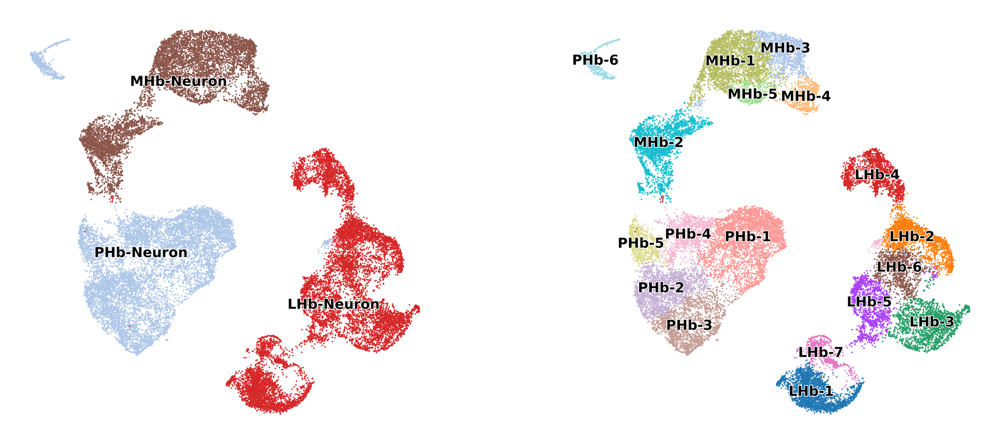

In [225]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden_annotation.pdf'
)


In [234]:
adata_neuron.obs['neuron_UMAP_1'] = adata_neuron.obsm['X_umap'][:,0]
adata_neuron.obs['neuron_UMAP_2'] = adata_neuron.obsm['X_umap'][:,1]


In [235]:
# save data with the cluster labels:
adata_neuron.write('{}neuronal_processed.h5ad'.format(data_dir))
adata_neuron.obs.to_csv('{}neuronal_processed_cell_meta.csv'.format(data_dir))

## add neuronal subclusters to the full data object

In [238]:
# load data 
adata_neuron = sc.read('{}neuronal_processed.h5ad'.format(data_dir))
neuron_meta = adata_neuron.obs[['barcode', 'leiden', 'cell_type', 'annotation', 'neuron_UMAP_1', 'neuron_UMAP_2']]
neuron_meta = neuron_meta.rename({
    'leiden':'neuron_leiden',
    'cell_type':'neuron_type'
}, axis=1)
neuron_meta.head()

,barcode,neuron_leiden,neuron_type,annotation,neuron_UMAP_1,neuron_UMAP_2
ATAGAGATCCGCACTT-1-0,ATAGAGATCCGCACTT-1-0,6,LHb-Neuron,LHb-3,11.854525,-2.002780
AGAGCAGCAGACGGAT-1-0,AGAGCAGCAGACGGAT-1-0,8,PHb-Neuron,PHb-3,-0.827034,-2.214332
ACCTACCAGTCTGTAC-1-0,ACCTACCAGTCTGTAC-1-0,6,LHb-Neuron,LHb-3,11.558245,-1.808692
GTGAGCCGTATTTCCT-1-0,GTGAGCCGTATTTCCT-1-0,8,PHb-Neuron,PHb-3,0.780995,-1.185169
GCACGGTTCCTCACCA-1-0,GCACGGTTCCTCACCA-1-0,8,PHb-Neuron,PHb-3,-0.015879,-2.541773


In [240]:
# transfer metadata
temp = adata.obs.merge(
    neuron_meta, how='left',
    on = 'barcode'
)


temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

# upadte cell type column
adata.obs['cell_type'] = np.where(
    adata.obs.cell_type.isin(['MHb-Neuron', 'LHb-Neuron', 'PHb-Neuron']),
    adata.obs.neuron_type,
    adata.obs.cell_type
)

# set annotation
adata.obs['annotation'] = np.where(
    adata.obs.cell_type.isin(['MHb-Neuron', 'LHb-Neuron', 'PHb-Neuron']),
    adata.obs.annotation,
    adata.obs.cell_type
)


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'annotation' as categorical


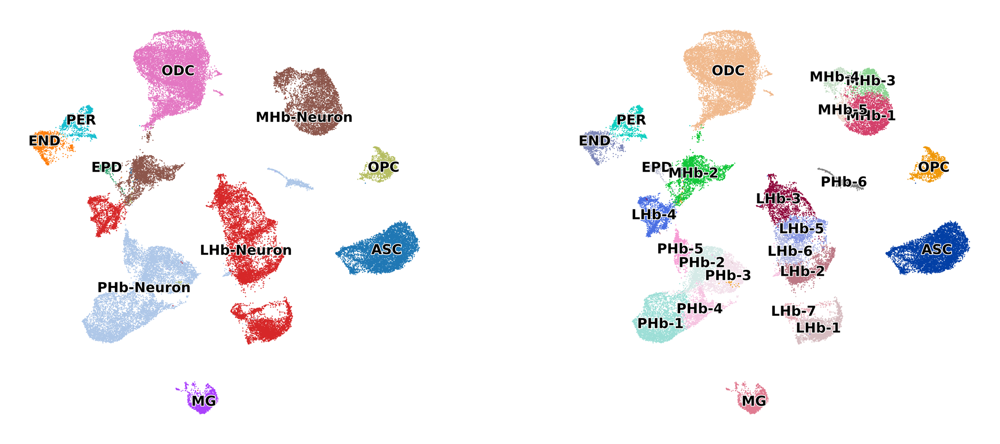

In [246]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type', 'annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_full_neuronal_leiden_annotation.pdf'
)


In [252]:
# remove meta-data columns that we don't need:
adata.obs = adata.obs.drop(['doublets', 'Name..Wood.lab.marking.', 'Sample.No.', 'batch'], axis=1)

In [253]:
# save the annotated data object
adata.write('{}harmony_annotated_april2023.h5ad'.format(data_dir))


## Save the individual components so we can make a seurat obj from scratch 

* Counts matrix (genes x cells .mtx)
* Scaled data matrix  (genes x cells .mtx)
* PCA 
* Harmony 
* obs table 
* var table

In [295]:
adata = sc.read_h5ad('{}harmony_annotated.h5ad'.format(data_dir))

In [296]:
# write the obs and var tables:
adata.obs.to_csv('{}harmony_annotated_cell_meta.csv'.format(data_dir))
adata.var.to_csv('{}harmony_annotated_gene_meta.csv'.format(data_dir))


In [298]:
# remove most of the obs columns because it really doesn't like NaNs
adata.obs = adata.obs[['Sample', 'barcode', 'Assignment', 'Group']]

In [299]:
# re-name harmony
adata.obsm['X_harmony'] = adata.obsm['X_pca_harmony']
del adata.obsm['X_pca_harmony']

In [300]:
adata.write('{}harmony_annotated_for_seurat.h5ad'.format(data_dir))

